In [1]:
from functools import partial
from collections.abc import Iterable

import numpy as np
import scipy.stats

import matplotlib.pyplot as plt

from matplotlib.animation import ArtistAnimation
from IPython.display import HTML

In [2]:
title = "# Sampling from distributions"
# Print title and setup TeX defs for both KaTeX and MathJax
import bayesian_stats_course_tools
bayesian_stats_course_tools.misc.display_markdown_and_setup_tex(title)

import matplotlib.style
matplotlib.style.use("bayesian_stats_course_tools.light")

# Sampling from distributions

<!-- Define LaTeX macros -->
$\def\E{\operatorname{E}}$
$\def\Var{\operatorname{Var}}$
$\def\Cov{\operatorname{Cov}}$
$\def\dd{\mathrm{d}}$
$\def\ee{\mathrm{e}}$
$\def\Norm{\mathcal{N}}$
$\def\Uniform{\mathcal{U}}$

<!-- MathJax needs them to be defined again for the non-inline environment -->
$$\def\E{\operatorname{E}}$$
$$\def\Var{\operatorname{Var}}$$
$$\def\Cov{\operatorname{Cov}}$$
$$\def\dd{\mathrm{d}}$$
$$\def\ee{\mathrm{e}}$$
$$\def\Norm{\mathcal{N}}$$
$$\def\Uniform{\mathcal{U}}$$

In Bayesian data analyses we often need to sample from probability distributions that cannot be sampled from directly.

Luckily the rise of Monte Carlo algorithms and powerful computers have made this possible.

We first have a look at rejection sampling. Conceptionally easy but very inefficient in high dimensions.

Then we go through three common sampling approaches:
- Metropolis-Hastings
- Slice sampling
- Nested sampling

Hamilton Monte Carlo and variational inference we leave until later.

The standard reference for this topic is chapter 29 in Information Theory, Inference, and Learning Algorithms.


Once we have samples from a distribution we can compute expectations under this distribution.

If we want to evaltuate the expectation of $f(x)$ with respect to the distribution $p$:
$$
    \Phi = \E[f(\vec x)] = \int f(\vec x)p(\vec x)\dd x^n
$$

If we have $N$ samples $\vec x_i\sim p$, we can approximate $\Phi$ as
$$
    \hat\Phi = \frac{1}{N}\sum_i f(\vec x_i)
$$

If we have $N$ samples $x_{ij}$ from a $d$-dimensional distribution ($i = 1,\dots,N$, $j=1,\dots,d$), we get samples from the marginal distributions by dropping the columns of the matrix $x_{ij}$ that correspond the the dimensions we want to marginalise over.


Our target distribution we want to sample from:

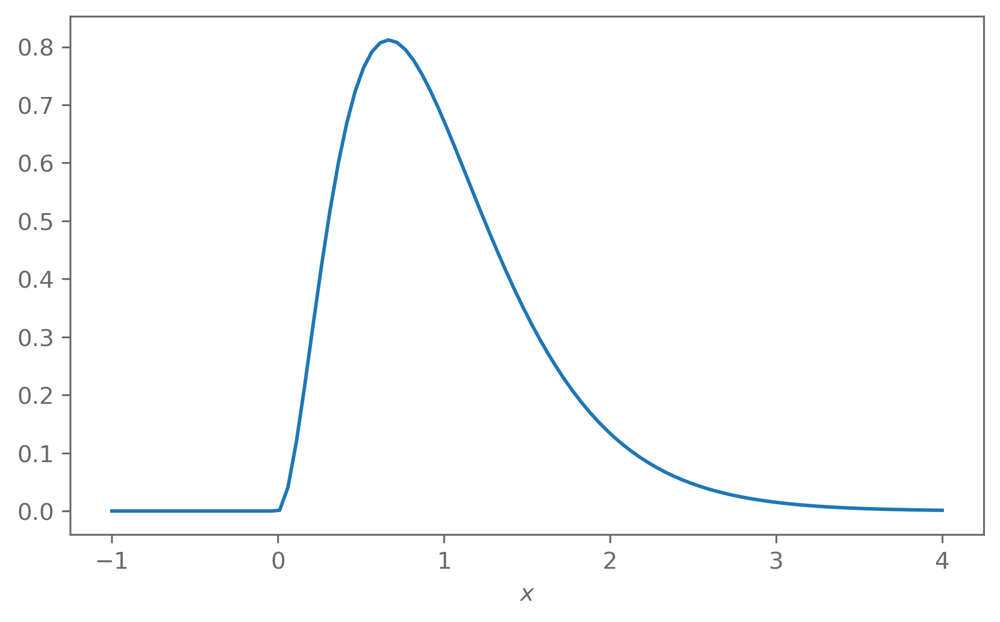

In [3]:
target_distr = scipy.stats.gamma(a=3, scale=1/3)

grid = np.linspace(-1, 4, 100)
plt.plot(grid, target_distr.pdf(grid))
plt.xlabel("$x$");

## Rejection sampling

The basic idea is to generate points $(x, y)$ that sample the area under $p(x)$ uniformly.

While we cannot sample from $p(x)$, we assume we can find a distribution $q(x)$ that we can sample from and for which
$$
M q(x) > p(x)\ \forall x
$$
for some constant $M$.

We then sample $x_i$ from $q(x)$ and $u_i|x_i\sim\Uniform(0, M q(x_i))$. 
The points $(x_i, u_i)$ sample the are under the curve $M q(x)$ uniformly.

From this sample of points, we remove those where $u_i > p(x_i)$, which leaves us with points that uniformly sample the area under $p(x)$ and thus $x_i\sim p$.

In [ ]:
# We use a Gaussian as our proposal distribution q and set M to 3
proposal_distr = scipy.stats.norm(loc=0.5, scale=1.3)
M = 3

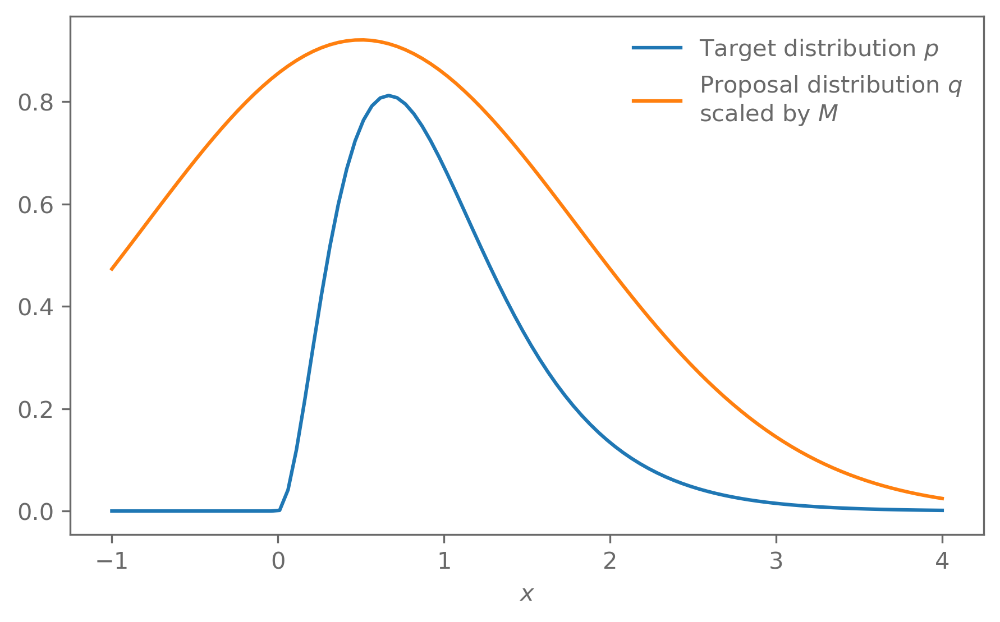

In [6]:
plt.plot(grid, target_distr.pdf(grid), label="Target distribution $p$")
plt.plot(grid, M*proposal_distr.pdf(grid), label="Proposal distribution $q$\nscaled by $M$")
plt.xlabel("$x$")
plt.legend(frameon=False);

In [11]:
def sample_with_viz(n):
    samples_generated = 0
    while samples_generated < n:
        x = proposal_distr.rvs(size=1)
        u = np.random.uniform(size=1)

        f = target_distr.pdf(x)
        g = proposal_distr.pdf(x)

        accept = u < f/(M*g)
        samples_generated += 1
        yield accept, x, u, f, M*g

hist_bins = np.linspace(grid[0], grid[-1], 10)
hist_bin_width = hist_bins[1] - hist_bins[0]

fig, ax = plt.subplots(1, 1, facecolor="none")
fig.patch.set_alpha(0.0)

ax.plot(grid, target_distr.pdf(grid), color="C0")
ax.plot(grid, M*proposal_distr.pdf(grid), color="grey")
ax.set_xlabel("$x$")

_, _, hist = ax.hist(
    x=np.array([]), bins=hist_bins,
    density=False, alpha=0.5, color="C0"
)

samples = []
artists = []
accepted_points_artists = []
rejected_points_artists = []

generated_objects = list(sample_with_viz(80))
n_accepted = sum(accept for accept, _, _, _, _ in generated_objects)

for i, (accept, x, u, f, Mg) in enumerate(generated_objects):
    if i < 4:
        vline = ax.vlines(x=x, ymin=0, ymax=Mg, color="grey")
        artists.append([vline] + accepted_points_artists + rejected_points_artists + list(hist.patches))

        point = ax.plot(x, Mg*u, marker="o", color="black")
        artists.append([vline] + point + accepted_points_artists + rejected_points_artists + list(hist.patches))

    if accept:
        samples.append(x)
        point = ax.plot(x, Mg*u, marker="o", color="C0")
        accepted_points_artists += point
    else:
        point = ax.plot(x, Mg*u, marker="o", color="grey")
        rejected_points_artists += point
    _, _, hist = ax.hist(
        x=np.array(samples), bins=hist_bins,
        weights=1/n_accepted/hist_bin_width*np.ones(len(samples)),
        density=False, alpha=0.5, color="C0"
    )

    artists.append(accepted_points_artists + rejected_points_artists + list(hist.patches))


rejection_sampling_ani = ArtistAnimation(fig, artists=artists, blit=True)
# rejection_sampling_ani.save("plots/rejection_sampling.html", writer="html")
plt.close()
HTML(rejection_sampling_ani.to_jshtml())

In [7]:
def sample(n):
    samples_generated = 0
    rejections = 0
    while samples_generated < n:
        x = proposal_distr.rvs(size=1)
        u = np.random.uniform(size=1)

        f = target_distr.pdf(x)
        g = proposal_distr.pdf(x)

        if u < f/(M*g):
            samples_generated += 1
            yield x
        else:
            rejections += 1

    acceptance_rate = samples_generated/(samples_generated+rejections)
    print(f"Acceptance rate: {acceptance_rate}")

Acceptance rate: 0.3359086328518643


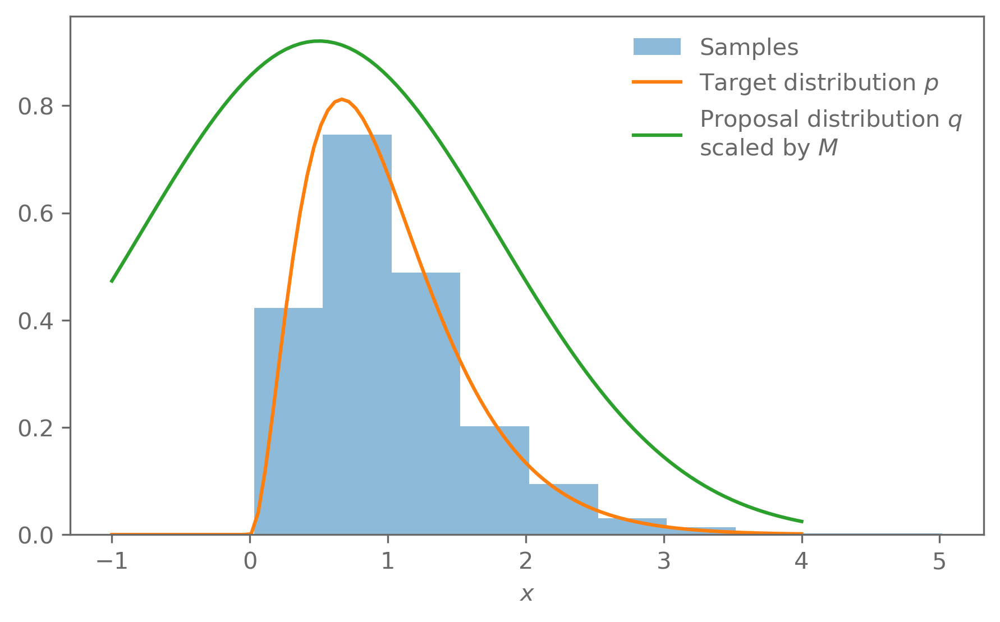

In [8]:
samples = []
for x in sample(1000):
    samples.append(x)

plt.hist(np.array(samples), density=True, alpha=0.5, label="Samples")
plt.plot(grid, target_distr.pdf(grid), label="Target distribution $p$")
plt.plot(grid, M*proposal_distr.pdf(grid), label="Proposal distribution $q$\nscaled by $M$")
plt.xlabel("$x$")
plt.legend(frameon=False);

### Challenges with rejection sampling

Finding a good proposal and $M$.

Curse of dimensionality: assume we want to sample uniformly from a disc of radius 1 and use uniform distribution on the square around the disc as the proposal distribution. 

The acceptance rate in this case is $\frac{\text{area of disc}}{\text{area of square}} = \frac{\pi}{2^2} \approx 0.79$. Pretty good!

In $d$ dimensions, the acceptance rate is 
$$
    \frac{\text{volume of unit ball}}{\text{volume of hypercube}} = \frac{\pi^\frac{d}{2}}{\Gamma(\frac{d}{2}+1)}\frac{1}{2^d}
$$


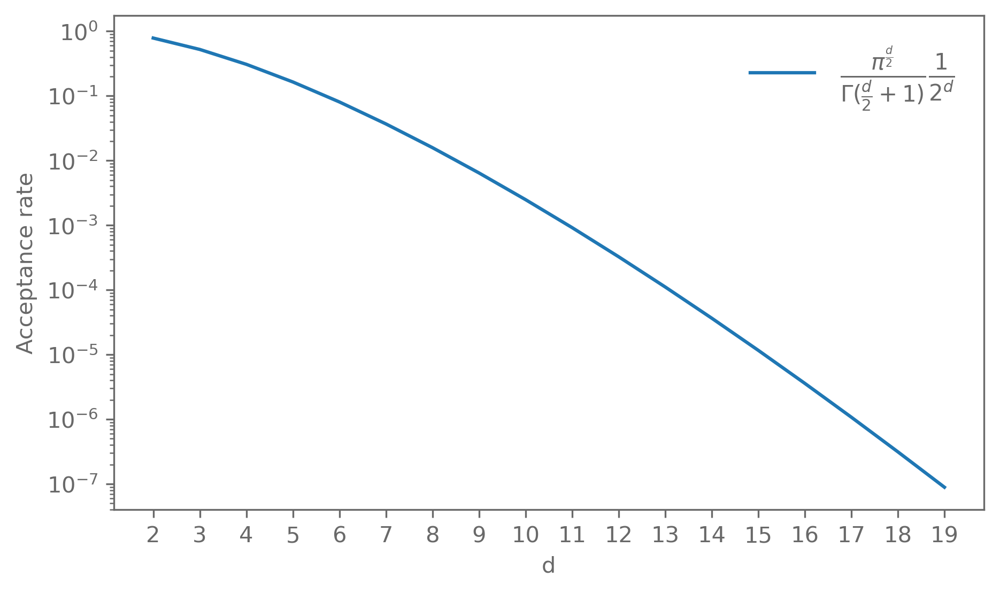

In [9]:
from scipy.special import gamma as Gamma
n = np.arange(2, 20)
acceptance_rate = np.pi**(n/2)/Gamma(n/2+1)/2**n

fig, ax = plt.subplots()
ax.semilogy(n, acceptance_rate, label=r"$\frac{\pi^\frac{d}{2}}{\Gamma(\frac{d}{2}+1)}\frac{1}{2^d}$")
ax.set_xlabel("d")
ax.set_ylabel("Acceptance rate")
ax.set_xticks(n)
ax.legend(frameon=False, fontsize="x-large")
fig.dpi = 300

### Exercise

Implement your own rejection sampling routine and test it with different target and proposal distributions.

## Markov chains Monte Carlo

Many of the Monte Carlo methods in use are built around the concept of Markov chains. 
Using such Markov chains to sample from a distribution is called Markov chain Monte Carlo (MCMC). 

A Markov chain is a sequence of RVs $X_0,\dots,X_t$ where the distribution of $X_t$ only depends on $X_{t-1}$. 

$$
\Pr(X_t = x_t | X_0=x_0,\dots X_{t-1}= x_{t-1}) = \Pr(X_t = x_t | X_{t-1}= x_{t-1})
$$

Knowing the states $X_0,\dots,X_{t-2}$ in addition to $X_{t-1}$ does not provide more information.

The probability to transition from state $y$ to $x$ is given by the transition probability $q(x | y)$.

The transition probability respects detailed balance if
$$
q(x|y)p(y) = q(y | x)p(x) 
$$

If $q$ satisfies detailed balance, then $p$ is a stationary distribution of the Markov chain.
A stationary distribution is unchanged under the transition function:
$$
    p(x) = \sum_{y} q(x | y)p(y)
$$
To show this
\begin{align}
    \sum_y q(x|y)p(y) &= \sum_y q(y|x)p(x) \quad \text{(detailed balance)}\\
    &= p(x) \sum_y q(y|x) \\
    & = p(x)
\end{align}

This is the distribution we care about in MCMC: we can sample from $p(x)$ by creating a Markov chain using the transition probabilities $q(x|y)$, provided they satisfy detailed balance. 
We skipped over a lot of mathematical details and conditions here but this is the basic idea on how to sample from some distribution $p(x)$.

### Metropolis-Hastings

Metropolis-Hastings is a classical MCMC algorithm. It works as follows:
Given a distribution $p(x)$ we want to sample from, a proposal distribution $q(x|y)$, and a starting point $x_{t=0}$
1. Sample a proposal $x'$ from $q$: $x'\sim q(\cdot|x_t)$
2. Compute the quantity 
$$
    a = \frac{p(x')q(x_t|x')}{p(x_t)q(x'|x_t)}
$$
3. If $a\geq 1$, accept $x'$. If $a < 1$, accept $x'$ with probability $a$:
    - If accepted: $x_{t+1} = x'$
    - If rejected: $x_{t+1} = x_t$

In the case where $q$ is symmetric ($q(x|y)=q(y|x)$), $a = \frac{p(x')}{p(x_t)}$: if the proposed point has a higher probability than the previous point, accept it. Else, accept it with probability $a$.

In [7]:
# We use a normal distribution with variance 1 as the proposal
proposal_distr = partial(scipy.stats.norm, scale=1)

def sample_transition(x0):
    return proposal_distr(loc=x0).rvs(size=1)

def transition_prob(x, y):
    # Q(x; y)
    return proposal_distr(loc=y).pdf(x)

In [15]:
def sample_for_viz(n, x0):
    x0 = np.array([x0])
    for _ in range(n):
        x1 = sample_transition(x0)
        p0 = target_distr.pdf(x0)
        p1 = target_distr.pdf(x1)

        q01 = transition_prob(x0, x1)
        q10 = transition_prob(x1, x0)

        a = p1/p0 * q01/q10
        u = np.random.uniform(size=1)

        accept = a > u
        x0_tmp, x1_tmp = x0, x1
        if accept:
            x0 = x1
        yield accept, x0, x0_tmp, x1_tmp, p0, p1, u


fig, ax = plt.subplots(1, 1)
fig.patch.set_alpha(0.0)

ax.plot(grid, target_distr.pdf(grid), color="C0")

_, _, hist = ax.hist(
    x=np.array([]), bins=hist_bins,
    density=False, alpha=0.5, color="C0"
)

samples = []
artists = []
accepted_points_artists = []

n_sample = 100

for i, (accept, x, x0, x1, p0, p1, u) in enumerate(sample_for_viz(n_sample, x0=2.0)):
    if i < 4:
        x0_point = ax.plot(x0, p0, marker="o", color="k")
        x0_label = ax.text(x=x0+0.02, y=p0+0.02, s="$x_0$")

        artists.append(x0_point + [x0_label] + accepted_points_artists + list(hist.patches))

        x0_grid = np.linspace(x0-3, x0+3, 100)
        proposal_plot = ax.plot(x0_grid, transition_prob(x0_grid, x0), color="grey")

        artists.append(x0_point + [x0_label] + proposal_plot + accepted_points_artists + list(hist.patches))

        x1_point = ax.plot(x1, p1, marker="o", color="C4")
        x1_label = ax.text(x=x1+0.02, y=p1+0.02, s="$x_1$")

        artists.append(x0_point + [x0_label] + proposal_plot + x1_point + [x1_label] + accepted_points_artists + list(hist.patches))

        hlines = [ax.hlines(p0, xmin=x0, xmax=x1, color="k")]
        hlines.append(ax.hlines(p1, xmin=x0, xmax=x1, color="C4"))
        artists.append(x0_point + [x0_label] + proposal_plot + x1_point + [x1_label] + hlines + accepted_points_artists + list(hist.patches))

        if p0 > p1:
            hlines.append(ax.hlines(p0*u, xmin=x0, xmax=x1, ls="--", color="grey"))
            artists.append(x0_point + [x0_label] + proposal_plot + x1_point + [x1_label] + hlines + accepted_points_artists + list(hist.patches))

    samples.append(x)
    _, _, hist = ax.hist(
        x=np.array(samples), bins=hist_bins,
        weights=1/n_sample/hist_bin_width*np.ones(len(samples)),
        density=False, alpha=0.5, color="C0"
    )

    if accept:
        new_point = ax.plot(x1, p1, marker="o", color="C0")
    else:
        new_point = ax.plot(x0, p0, marker="o", color="C0")
    accepted_points_artists += new_point

    artists.append(list(hist.patches) + accepted_points_artists)

mh_animation = ArtistAnimation(fig, artists=artists)
plt.close()
HTML(mh_animation.to_jshtml())

In [4]:
def sample_metropolis_hastings(n, x0, target_distr,
                               sample_transition, transition_prob):
    x0 = np.atleast_1d(x0)
    for i in range(n):
        # Sample proposal
        x1 = sample_transition(x0)
        # Compute probabilities of the old and proposed states
        p0 = target_distr.pdf(x0)
        p1 = target_distr.pdf(x1)

        # Compute the transition probabilities
        q01 = transition_prob(x0, x1)
        q10 = transition_prob(x1, x0)

        a = p1/p0 * q01/q10

        u = np.random.uniform(size=1)
        if a >= u:
            # accept, proposed state becomes new state
            x0 = x1
            yield x1
        else:
            # reject, stay with current state
            yield x0

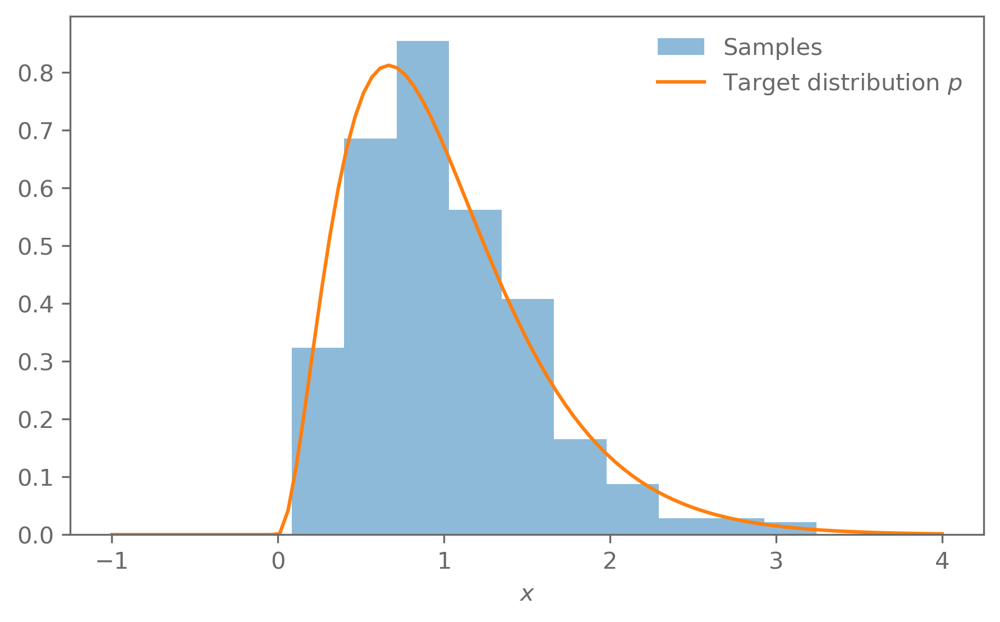

In [8]:
samples = []
for x in sample_metropolis_hastings(
        1000, x0=3, 
        target_distr=target_distr,
        sample_transition=sample_transition,
        transition_prob=transition_prob):
    samples.append(x)

plt.hist(np.array(samples)[100:], density=True, alpha=0.5, label="Samples")
plt.plot(grid, target_distr.pdf(grid), label="Target distribution $p$")
plt.xlabel("$x$")
plt.legend(frameon=False);

### Challenges with Metropolis-Hastings

Metropolis-Hastings still requires a well-tuned proposal distribution to work well.

If the proposal is too broad, the acceptance rate goes down, because proposed points are likely in a low-probability part of the target distribution.

If the proposal is too narrow, Metropolis-Hasting becomes a random walk, which takes a long time to explore the full volume of the target distribution.

Having the proposal be as close to the target distribution is optimal but for that you need to know the target distribution first!

### Exercise

- Implement Metropolis-Hastings for $n$ dimensional distributions
    - Sample from a 2D Gaussian (code on the next slide)
    - Plot the samples in the chain. How do the samples depend on the starting position?
- Show that Metropolis-Hastings satisfies detailed balance
    - Hint: $T(x|y) = q(x|y)\min(1, a)$

In [25]:
# Define variances and correlation
sigma_x = 1
sigma_y = 2
rho = 0.7

# Define mean and covariance
mean = np.array([1, 0.5])
cov = np.array([[sigma_x**2, sigma_x*sigma_y*rho],
                [sigma_x*sigma_y*rho, sigma_y**2]])

# Create distribution object
bivariate_normal = scipy.stats.multivariate_normal(mean=mean, cov=cov)

# Sample 1000 points. Do this with your MCMC implementation instead!
samples = bivariate_normal.rvs(size=1000)

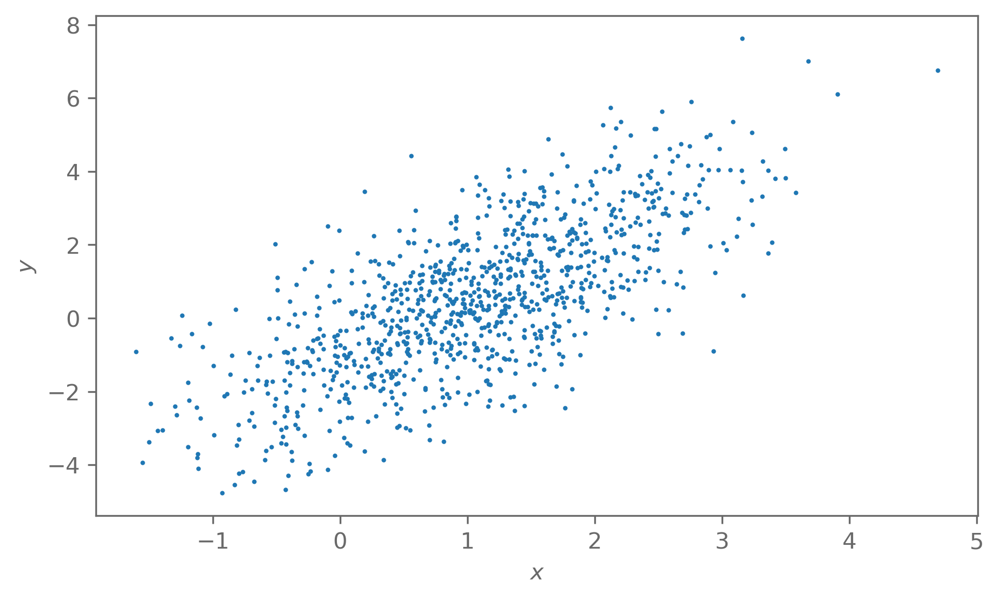

In [26]:
plt.scatter(*samples.T, s=1)
plt.ylabel("$y$")
plt.xlabel("$x$");

## Practical considerations for MCMC methods

The implementations shown here are the most barebones and simplest version of these methods. 
Implementing them yourselves is important to understand how these methods work and what some of the pitfalls are.

In a real-world application, with many parameters and complicated likelihoods, you probably want to use established implementations that use more sophisticated methods and are well-tested, instead of your own implementation. 

Examples are emcee, zeus, and dynesty.


Because the state of a Markov chains depends on the previous state, the samples generated in MCMC are not independent. This has a few implications:
- The chain will take some time to move from the starting position to the bulk of the target distribution. This burn-in phase needs to be removed from the chain.
- If we use $n$ samples from the chain to estimate a quantity of the distribution, for example the mean, then the variance of this estimate will not decrease as $\frac{1}{n}$, because the samples are correlated. 

This is demonstrated in the solutions to the Metropolis-Hasting exercise. 

A good description of the process can be found on the emcee documentation: https://emcee.readthedocs.io/en/stable/tutorials/autocorr/


### Slice sampling

Slice sampling is another MCMC method and similar in that regard to Metropolis-Hastings.

Because it also samples the volume under the target distribution uniformly, it has some similarities to rejection sampling. 

The advantage over MH is that is much less reliant on tuning the proposal.

Slice sampling proceeds as follows:

1. Sample $u$ uniformly between 0 and $p(x_t)$: $y\sim\Uniform(0, p(x_t))$
2. Find an interval $L < x_t < R$ such that $p(L) < y$ and $p(R) < y$
3. Draw $x'$ uniformly from the interval $[L, R]$: $x'\sim\Uniform(L, R)$
    - If $p(x') \leq u$, shrink the interval and return to 3.
    - If $p(x') > u$, the point $(x', u)$ lies under the curve $p(x)$, so accept $x'$: $x_{t+1} = c'$

- Finding the interval for step 2. uses a stepping out procedure:

    Given a step size $w$ (this is the tuning parameter of slice sampling)
    1. Draw $r\sim\Uniform(0,1)$
    1. Set $L= x_t - rw$, $R = x_t + (1-r)w$
    1. While $p(L) > u$: $L = L - w$
    1. While $p(R) > u$: $R = R + w$

- Shrinking the interval in step 3:
    1. While $p(x') \leq u$
        - If $x' > x_t$, $R = x'$
        - Else $L = x'$

In [27]:
step = 1

def sample_for_viz(n, x0):
    p0 = target_distr.pdf(x0)

    for _ in range(n):
        u = np.random.uniform()
        q = p0*u

        w = np.random.uniform()

        x_l, x_r = x0 - w*step, x0 + (1-w)*step

        def step_out(x, left=True):
            p = target_distr.pdf(x)
            xs = [x]
            while p > q:
                if left:
                    x -= step
                else:
                    x += step
                p = target_distr.pdf(x)
                xs.append(x)
            return xs
        
        xs_l_out, xs_r_out = step_out(x_l, left=True), step_out(x_r, left=False)
        x_l, x_r = xs_l_out[-1], xs_r_out[-1]
        x1s = []
        xs_l_in, xs_r_in = [], []
        while True:
            x1 = np.random.uniform(low=x_l, high=x_r)
            x1s.append(x1)
            xs_l_in.append(x_l)
            xs_r_in.append(x_r)
            p1 = target_distr.pdf(x1)
            if p1 >= q:
                break
            else:
                if x1 >= x0:
                    x_r = x1
                else:
                    x_l = x1
        
        x0_tmp, p0_tmp = x0, p0
        x0 = x1
        p0 = p1
        yield x0_tmp, p0_tmp, q, xs_l_out, xs_r_out, xs_l_in, xs_r_in, x1s

def plot_slice(ax, l, r, y):
    hline = ax.hlines(y=y, xmin=l, xmax=r, color="grey")
    xl_label = ax.text(x=l+0.02, y=q+0.02, s="$x_L$")
    xr_label = ax.text(x=r+0.02, y=q+0.02, s="$x_R$")
    return [hline, xl_label, xr_label]

fig, ax = plt.subplots(1, 1)
fig.patch.set_alpha(0.0)

ax.plot(grid, target_distr.pdf(grid), color="C0")

_, _, hist = ax.hist(
    x=np.array([]), bins=hist_bins,
    density=False, alpha=0.5, color="C0"
)

samples = []
artists = []
accepted_points_artists = []

n_sample = 80

for i, (x0, p0, q, xs_l_out, xs_r_out, xs_l_in, xs_r_in, x1s) in enumerate(sample_for_viz(n=n_sample, x0=2)):
    if i < 4:
        vline = ax.vlines(x=x0, ymin=0, ymax=p0, color="grey")
        x0_label = ax.text(x=x0+0.02, y=p0+0.02, s="$x_0$")

        artists.append([vline, x0_label] + accepted_points_artists + list(hist.patches))

        q_point = ax.plot(x0, q, marker="o", color="k")
        q_label = ax.text(x=x0+0.02, y=q+0.02, s="$q$")
        artists.append([vline, x0_label] + q_point + [q_label] + accepted_points_artists + list(hist.patches))

        n_out = max(len(xs_l_out), len(xs_r_out))
        xs_l_out += (n_out - len(xs_l_out)) * [xs_l_out[-1]]
        xs_r_out += (n_out - len(xs_r_out)) * [xs_r_out[-1]]
        for l, r in zip(xs_l_out, xs_r_out):
            slice_artist = plot_slice(ax, l, r, q)
            artists.append([vline, x0_label] + q_point + [q_label] + slice_artist + accepted_points_artists + list(hist.patches))
        
        for l, r, x1 in zip(xs_l_in, xs_r_in, x1s):
            x1_point = ax.plot(x1, q, marker="o", color="C4")
            slice_artist = plot_slice(ax, l, r, q)
            artists.append([vline, x0_label] + q_point + [q_label] + slice_artist + x1_point + accepted_points_artists + list(hist.patches))

    x1 = x1s[-1]
    x1_point = ax.plot(x1, q, marker="o", color="C0")
    accepted_points_artists += x1_point

    samples.append(x1)
    _, _, hist = ax.hist(
        x=np.array(samples), bins=hist_bins,
        weights=1/n_sample/hist_bin_width*np.ones(len(samples)),
        density=False, alpha=0.5, color="C0"
    )
    artists.append(accepted_points_artists + list(hist.patches))

    
slice_sampling_ani = ArtistAnimation(fig, artists=artists)
plt.close()
HTML(slice_sampling_ani.to_jshtml())

In [48]:
def sample_slice_sampling(n, x0, target_distr, step):
    p0 = target_distr.pdf(x0)

    for _ in range(n):
        u = np.random.uniform(0, p0)

        # Define the initial interval
        w = np.random.uniform(0, 1)
        x_l, x_r = x0 - w*step, x0 + (1-w)*step

        # Define a step-out function
        def step_out(x, left=True):
            p = target_distr.pdf(x)
            while p > u:
                if left:
                    x -= step
                else:
                    x += step
                p = target_distr.pdf(x)
            return x
        
        # Step out until p(x_l) < u and p(x_r) < u
        x_l, x_r = step_out(x_l, left=True), step_out(x_r, left=False)

        # Shrink the interval until we have a sample from under the 
        # curve of the target distribution
        while True:
            x1 = np.random.uniform(low=x_l, high=x_r)
            p1 = target_distr.pdf(x1)
            if p1 > u:
                # Accept the point x1
                break
            else:
                # Shrink the inverval
                if x1 >= x0:
                    x_r = x1
                else:
                    x_l = x1

        x0 = x1
        p0 = p1
        yield x0

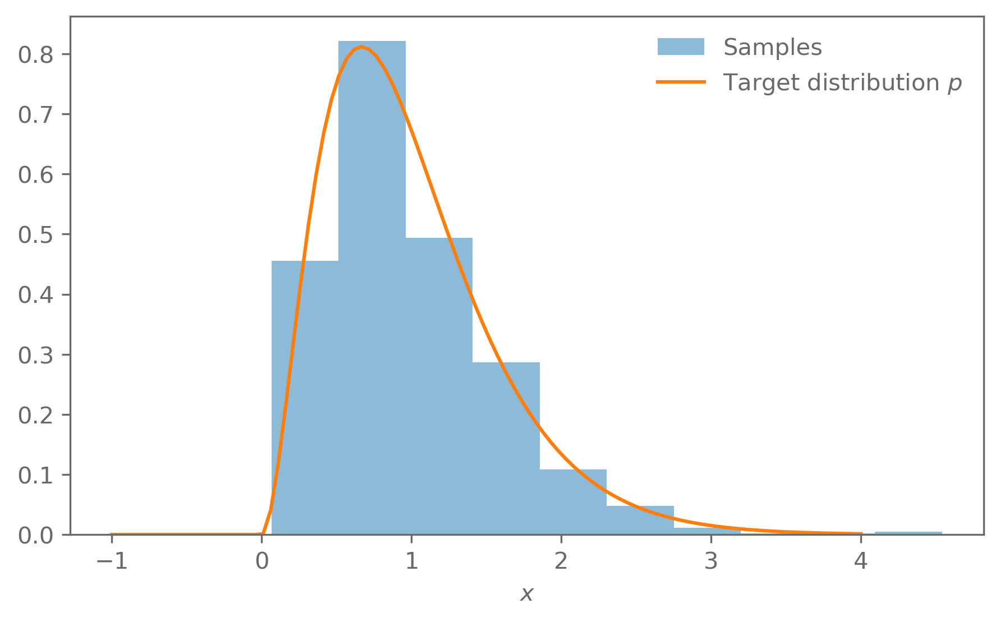

In [30]:
samples = []
for x in sample_slice_sampling(1000, x0=3, target_distr=target_distr, step=1):
    samples.append(x)

plt.hist(np.array(samples)[10:], density=True, alpha=0.5, label="Samples")
plt.plot(grid, target_distr.pdf(grid), label="Target distribution $p$")
plt.xlabel("$x$")
plt.legend(frameon=False);

Slice sampling is for example implemented in [zeus](https://zeus-mcmc.readthedocs.io), which uses a set of walkers like emcee to do the sampling.

Slice sampling is also being used under the hood in many nested sampling implementations.

## Nested sampling

A good review paper is https://arxiv.org/abs/2205.15570, which has come out just recently and gives a good introduction as well as summarises the state of the art in nested sampling.

Nested sampling takes a very different approach to sampling than the MCMC methods covered so far. 
The main advantage is its ability to estimate the evidence. Remember Bayes' theorem
$$
    p(\theta|d) = \frac{p(d|\theta)p(\theta)}{p(d)}
$$
To make the notation clearer (and consistent with some of the literature on nested sampling), write this as
$$
    p(\theta|d) = \frac{L(\theta)\pi(\theta)}{Z} \ ,
$$
where $L(\theta) = p(d|\theta)$ is the likelihood, $\pi(\theta)=p(\theta)$ the prior, and $Z=p(d)$ the evidence or marginal likelihood.



Evaluting the evidence 
$$
    Z = \int L(\theta)\pi(\theta)\dd \theta
$$
by naive integration is usually intractable for high-dimensional problems. To see this, imagine discretising the integral into 50 intervals: $Z = \sum_i^{50} L(\theta_i)\pi(\theta_i)\Delta\theta$. In 10 dimensions (which is not much as far as real-world applications are concerned), this would require $50^{10}\approx 10^{17}$ evaluations of the likelihood. 

The idea behind nested sampling is to rewrite the integral so that instead of integrating over $\theta$, the integral is over levels of the likelihood. This is somewhat like doing Lebesgue integration instead of Riemann integration.
$$
    Z = \int X(L)\dd L = \int L(X)\dd X\ ,
$$
where $X(L^*)$ is the volume of the likelihood (weighted by the prior) above some likelihood level $L^*$:
$$
    X(L^*) = \int_{L(\theta)>L^*}\pi(\theta)\dd \theta
$$



The nested sampling algorithm works like this:
1. Sample $n_\mathrm{live}$ live points from the prior
2. At each iteration $i$, find the point with the lowest likelihood. This now becomes a dead point. We record its likelihood $L_i^*$ and remove the dead point from our live points.
3. Sample a new point from the prior, with the constraint that $L(\theta) > L_i^*$
4. Estimate the volume $X_i$ of the likelihood above $L_i^*$.
5. Estimate $Z = \sum_i L_i^*\Delta X_i$ and iterate from 2. until some convergence criterion on $Z$ is reached.



How do we estimate the volumes $X_i$? The idea is similar to the Monte Carlo estimation of $\pi$ at the beginning of the course: we sample an outer volume (the square) and count how many point end up inside the smaller inner volume (the quadrant of the circle). The ratio of the volumes is then approximated by the ratio of the points inside the inner volume over all the points. 

In nested sampling, the inner volume is $X_i$, the volume of the likelihood where $L(\theta)>L_i^*$, has the $n_\mathrm{live}$ live points.

The outer volume, the volume of the likelihood where $L(\theta)>L_{i-1}^*$ has $n_\mathrm{live}+1$ points. The $n_\mathrm{live}$ live points plus the recent dead point. 

At each iteration, the volume $X(L)$ therefore decreases by a factor of approximately $t_i\approx\frac{n_\mathrm{live}}{n_\mathrm{live}+1}$. 

The volume after $i$ iterations is then $X_i = t_i X_{i-1} =  t_i \dots t_1 X_0$, with $X_0 = 1$.

The dead points sample the posterior, when weighted properly:
$$
    p_i = \frac{w_i L_i^*}{Z}\ ,\quad w_i=\frac{1}{2}(X_{i-1} - X_{i+1})
$$

In [9]:
# We need to define separate likelihood and prior for nested sampling
log_likelihood = target_distr.logpdf
prior = scipy.stats.uniform(0., 2.)

In [41]:
import scipy.optimize
import matplotlib.patches
import matplotlib.collections


def sample_for_viz(log_likelihood, prior, n_live, n_iter):
    live_points = prior.rvs(n_live)
    log_L = log_likelihood(live_points)
    if not np.all(np.isfinite(log_L)):
        raise ValueError("Non-finite log likelihood for some points.")

    dead_points = []
    dead_points_log_L = []

    birth_points = []
    birth_points_log_L = []

    n_eval = live_points.shape[0]
    for i in range(n_iter):
        idx = np.argmin(log_L)
        log_L_star = log_L[idx]

        dead_points.append(live_points[idx])
        dead_points_log_L.append(log_L_star)

        while True:
            new_point = prior.rvs(1)
            log_L_new = log_likelihood(new_point)
            n_eval += 1
            if np.isfinite(log_L_new) and log_L_new > log_L_star:
                birth_points.append(new_point)
                birth_points_log_L.append(log_L_new)
                break
        
        yield live_points, log_L, idx, dead_points, dead_points_log_L, birth_points, birth_points_log_L
        
        live_points[idx] = new_point
        log_L[idx] = log_L_new

        

fig, ax = plt.subplots(1, 1)
fig.patch.set_alpha(0.0)

ax.plot(grid, target_distr.pdf(grid), color="C0")

artists = []

L_star_last = 0
L_levels = []

for live_points, log_L, idx, dead_points, dead_points_log_L, birth_points, birth_points_log_L in sample_for_viz(
        log_likelihood=log_likelihood, prior=prior, n_live=10, n_iter=20):
    
    live_points_plot = ax.scatter(live_points, np.exp(log_L), c="grey")
    dead_points_plot = ax.scatter(dead_points[:-1], np.exp(dead_points_log_L[:-1]), c="C3")

    new_dead_point = ax.scatter(dead_points[-1], np.exp(dead_points_log_L[-1]), c="C3")
    new_point = ax.scatter(birth_points[-1], np.exp(birth_points_log_L[-1]), c="C2")

    log_L_star = dead_points_log_L[-1]
    theta_star = dead_points[-1]
    try:
        res = scipy.optimize.root_scalar(lambda x: log_likelihood(x) - log_L_star, method="brentq", bracket=(0, theta_star-1e-4), x0=0)
    except ValueError:
        res = scipy.optimize.root_scalar(lambda x: log_likelihood(x) - log_L_star, method="brentq", bracket=(theta_star+1e-4, 4), x0=4)
    theta_prime = res.root

    L_levels += [matplotlib.patches.Rectangle(
        xy=(min(theta_prime, theta_star), L_star_last),
        width=abs(theta_prime-theta_star),
        height=np.exp(log_L_star)-L_star_last
    )]
    L_star_last = np.exp(log_L_star)

    boxes = [ax.add_collection(matplotlib.collections.PatchCollection(L_levels[:-1]))]

    artists.append(
        [live_points_plot] + [dead_points_plot] + [new_dead_point] + boxes
    )
    artists.append(
        [live_points_plot] + [dead_points_plot] + [new_dead_point] + [new_point] + boxes
    )
    boxes = [ax.add_collection(matplotlib.collections.PatchCollection(L_levels))]
    artists.append(
        [live_points_plot] + [dead_points_plot] + [new_dead_point] + [new_point] + boxes
    )



nested_sampling_ani = ArtistAnimation(fig, artists=artists)
plt.close()
HTML(nested_sampling_ani.to_jshtml())

In [10]:
from scipy.special import logsumexp
import tqdm

def sample_nested_sampling(log_likelihood, prior, n_live,
                           tol=0.01, n_max_iter=100000):
    # Sample the initial set of live points from the prior
    live_points = prior.rvs(n_live)
    # Get their log likelihoods
    log_L = log_likelihood(live_points)
    if not np.all(np.isfinite(log_L)):
        raise ValueError("Non-finite log likelihood for some points.")

    # Set up some book-keeping
    log_tol = np.log(tol)

    log_X = [0,]

    dead_points = []
    dead_points_log_L = []

    n_eval = live_points.shape[0]
    drain_live_points = False
    i = 0
    progress = tqdm.tqdm()
    while i < n_max_iter:
        # Find the live point with the lowest likelihood
        idx = np.argmin(log_L)
        # Call the likelihood at this point L^*
        log_L_star = log_L[idx]

        # This lowest likelihood point becomes a dead point
        dead_points.append(live_points[idx])
        dead_points_log_L.append(log_L_star)

        # Estimate the shrinkage of the likelihood volume when removing the
        # lowest-likelihood point
        log_t = -1/n_live
        log_X.append(log_X[-1] + log_t)
        
        # Check for convergence of the evidence estimate
        if i > 4:
            # Compute the volumes and weights
            X = np.exp(np.array(log_X))
            w = 0.5*(X[:-2]- X[2:])
            # Estimate Z = \sum_i w_i L^*_i
            log_Z = logsumexp(np.array(dead_points_log_L[:-1]), b=w)
            # Estimate the error on Z as the mean of the likelihoods of the
            # live points times the current likelihood volume
            # \Delta Z = X_i \frac{1}{n_{live}}\sum_j L_j
            log_mean_L = logsumexp(log_L, b=1/n_live)
            log_Delta_Z = log_mean_L + log_X[-1]
            # If the estimated error is less than the tolerance, stop sampling
            # new live points for the dead points that get removed
            if log_Delta_Z - log_Z < log_tol:
                drain_live_points = True
                live_points = np.delete(live_points, idx)
                log_L = np.delete(log_L, idx)
                if len(log_L) == 0:
                    break
            
            progress.set_postfix({"log_Z": log_Z, "n_eval": n_eval, "iter": i})

        # Sample a new live point from the prior with a likelihood higher than
        # L^*
        while not drain_live_points:
            # Sampling from the whole prior is very inefficient, in practice
            # there are more sophisticed sampling schemes
            new_point = prior.rvs(1)
            log_L_new = log_likelihood(new_point)
            n_eval += 1
            if np.isfinite(log_L_new) and log_L_new > log_L_star:
                live_points[idx] = new_point
                log_L[idx] = log_L_new
                break
        
        i += 1
    
    # Because the estimate of the volumes is stochastic, we can sample many of 
    # them to get the uncertainty on our evidence estimate
    dead_points = np.array(dead_points)
    dead_points_log_L = np.array(dead_points_log_L)
    n_sample = 100
    t_sample = scipy.stats.beta(n_live, 1).rvs((n_sample, len(dead_points_log_L)))
    log_X_sample = np.insert(np.cumsum(np.log(t_sample), axis=1), 0, 0, axis=1)
    X_sample = np.exp(log_X_sample)
    w_sample = 0.5*(X_sample[:, :-2]- X_sample[:, 2:])
    log_Z = scipy.special.logsumexp(dead_points_log_L[:-1], b=w_sample, axis=1)

    return log_Z, dead_points, w*np.exp(dead_points_log_L)[:-1]


In [11]:
log_Z, dead_points, weights = sample_nested_sampling(
    log_likelihood=log_likelihood, prior=prior,
    n_live=100, tol=0.01, n_max_iter=10000)

# In this case we can find the exact evidence by direct integration
import scipy.integrate
log_Z_exact = np.log(scipy.integrate.quad(lambda x: target_distr.pdf(x)*prior.pdf(x), 0, 4)[0])

print(f"Exact log Z: {log_Z_exact:.2f}")
print(f"Nested sampling estimate of log Z: {np.mean(log_Z):.2f}±{np.std(log_Z):.2f}")

0it [00:01, ?it/s, log_Z=-.751, n_eval=16058, iter=613]

Exact log Z: -0.76
Nested sampling estimate of log Z: -0.75±0.04


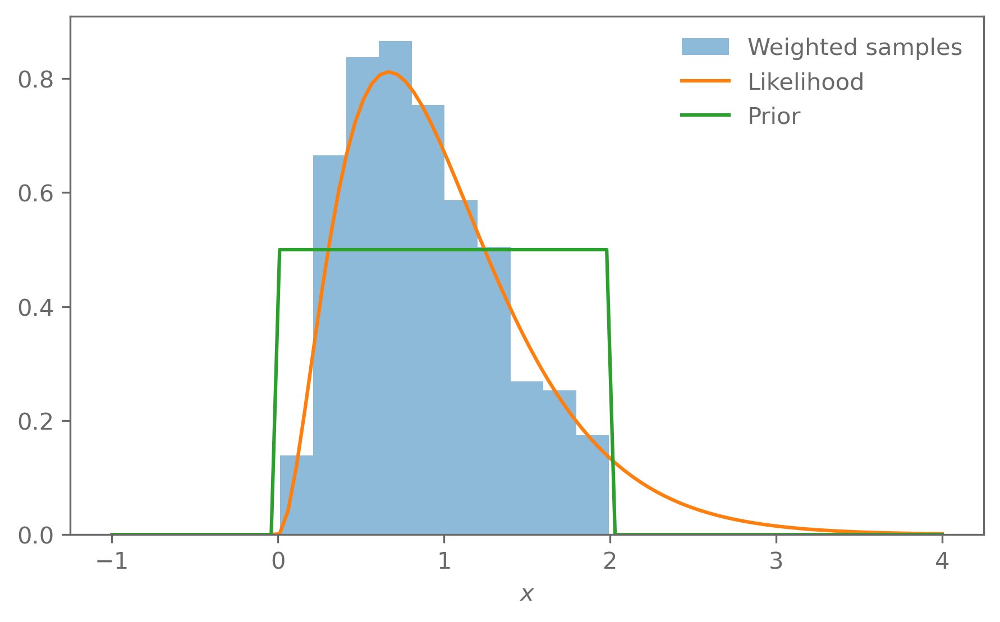

In [12]:
plt.hist(dead_points[:-1], density=True, weights=weights, alpha=0.5, label="Weighted samples")
plt.plot(grid, target_distr.pdf(grid), label="Likelihood")
plt.plot(grid, prior.pdf(grid), label="Prior")
plt.xlabel("$x$")
plt.legend(frameon=False);

### Challenges with nested sampling

The big challenge in implementing nested sampling in practice is sampling from the prior with a likelihood constraint. This requires running MCMC or rejection sampling at each step to get a new live point.

If all you care about is posterior samples, then nested sampling can be quite inefficient. 
Its strength is really the estimation of the evidence, which is important for model comparison.

The evidence is sensitive to the prior volume:
$$
    Z = \int L(\theta)\pi(\theta)\dd \theta
$$

Let us assume we have a uniform prior over some volume $V$: $\pi(\theta) \propto \frac{1}{V}$.

If the likelihood is much more constraining than the prior, the posterior does not change when we change the size of the prior. 

But the evidence scales with the prior volume: $Z\propto \frac{1}{V}$. When comparing models, some care must be taken as not to be affected by prior volumes.

### Dynesty

A well-developed package for doing nested sampling is [dynesty](https://dynesty.readthedocs.io). Other options are [PolyChord](https://github.com/PolyChord/PolyChordLite) or [ultranest](https://johannesbuchner.github.io/UltraNest/index.html).

The dynesty and ultranest documentations also have good tutorials and explanations on how nested sampling works.



To allow sampling from the prior, these packages usually require you define a prior transform function that maps samples from the unit (hyper)-cube to samples from your prior using inverse transform sampling.

In [21]:
def prior_transform(u):
    """Transforms samples `u` drawn from the unit cube to samples to those
    from our U(0, 2) prior"""

    return 2*u

In [28]:
import dynesty

sampler = dynesty.NestedSampler(
    loglikelihood=lambda x: log_likelihood(x).squeeze(), # Need to add the squeeze so it works in 1d
    prior_transform=prior_transform,
    ndim=1,
    nlive=100,
)
sampler.run_nested(print_progress=False)

# Show summary of the run
sampler.results.summary()

# We can samples from the distribution
samples = sampler.results.samples_equal()

Summary
nlive: 100
niter: 283
ncall: 1572
eff(%): 24.364
logz: -0.751 +/-  0.059


## Exercise

Implement your own nested sampling or slice sampling routine. Or both if you are ambitious.

Use both emcee and dynesty on the 2D Gaussian from the Metropolis-Hastings exercise.

Go back to the line-fitting exercise. Use nested sampling to find the evidences for a linear and a quadratic model. Which model is preferred by the data?